In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import geopandas as gpd

In [2]:
df1 = pd.read_csv('South Korea-seoul_Monthly_Match_2022-08-17.csv')
df2 = pd.read_csv('South Korea-seoul_Property_Extended_Match_2022-08-17.csv')

C:\Users\hongju\AppData\Local\Temp\ipykernel_11128\4115286929.py:1: DtypeWarning: Columns (24,27,28) have mixed types. Specify dtype option on import or set low_memory=False.
  df1 = pd.read_csv('South Korea-seoul_Monthly_Match_2022-08-17.csv')
C:\Users\hongju\AppData\Local\Temp\ipykernel_11128\4115286929.py:2: DtypeWarning: Columns (26,51,59,60,62) have mixed types. Specify dtype option on import or set low_memory=False.
  df2 = pd.read_csv('South Korea-seoul_Property_Extended_Match_2022-08-17.csv')


In [3]:
df1.head()

,Property ID,Property Type,Listing Type,Bedrooms,Reporting Month,Occupancy Rate,Revenue (USD),Revenue (Native),ADR (USD),ADR (Native),...,Metropolitan Statistical Area,Latitude,Longitude,Active,Scraped During Month,Currency Native,Airbnb Property ID,Airbnb Host ID,HomeAway Property ID,HomeAway Property Manager
0,ab-658150652762678230,Rental unit,Private room,1.0,2022-06-01,0.033,23.0,0.0,23.00,0.00,...,NaN,37.588926,126.992914,True,True,KRW,6.581507e+17,27975258.0,NaN,NaN
1,ab-658150652762678230,Rental unit,Private room,1.0,2022-07-01,0.400,360.0,469655.2,36.00,46965.52,...,NaN,37.588926,126.992914,True,True,KRW,6.581507e+17,27975258.0,NaN,NaN
2,ab-658169356486186539,Rental unit,Entire home/apt,1.0,2022-06-01,0.000,0.0,0.0,NaN,NaN,...,NaN,37.557404,127.040654,True,True,USD,6.581694e+17,38621584.0,NaN,NaN
3,ab-658169356486186539,Rental unit,Entire home/apt,1.0,2022-07-01,0.000,0.0,0.0,NaN,NaN,...,NaN,37.557404,127.040654,True,True,USD,6.581694e+17,38621584.0,NaN,NaN
4,ab-658213094852126788,Townhouse,Private room,1.0,2022-07-01,0.774,1063.0,1388000.0,44.29,57833.33,...,NaN,37.560640,126.918663,True,True,KRW,6.582131e+17,454059471.0,NaN,NaN


In [4]:
df1.shape

(2038365, 29)

In [5]:
df1.columns

Index(['Property ID', 'Property Type', 'Listing Type', 'Bedrooms',
       'Reporting Month', 'Occupancy Rate', 'Revenue (USD)',
       'Revenue (Native)', 'ADR (USD)', 'ADR (Native)',
       'Number of Reservations', 'Reservation Days', 'Available Days',
       'Blocked Days', 'Country', 'State', 'City', 'Zipcode', 'Neighborhood',
       'Metropolitan Statistical Area', 'Latitude', 'Longitude', 'Active',
       'Scraped During Month', 'Currency Native', 'Airbnb Property ID',
       'Airbnb Host ID', 'HomeAway Property ID', 'HomeAway Property Manager'],
      dtype='object')

In [6]:
cols1 = df1.columns
for col in cols1:
    print('=================================')
    print(f'<<{col}>>')
    print(f'unique number: {len(df1[col].unique())}')
    print(df1[col].value_counts())

<<Property ID>>
unique number: 77798
Property ID
ab-1237444               93
ab-4746708               93
ab-2912128               93
ab-1171492               93
ab-2939620               93
                         ..
ab-674947709111428190     1
ab-674896433968008509     1
ab-674836597266937180     1
ab-674779831380181937     1
ab-676712795371929759     1
Name: count, Length: 77798, dtype: int64
<<Property Type>>
unique number: 144
Property Type
Apartment                     571030
House                         281576
Rental unit                   276120
Home                          173913
Condominium                    85254
                               ...  
Private room in tiny house        12
Car                               11
Shared room in guest suite        10
Entire pension                    10
Train                              3
Name: count, Length: 143, dtype: int64
<<Listing Type>>
unique number: 5
Listing Type
Entire home/apt    1168341
Private room        703649
Shar

In [7]:
properties = df1['Property ID'].unique()

In [8]:
df2.head()

,Property ID,Listing Title,Property Type,Listing Type,Created Date,Last Scraped Date,Country,State,City,Zipcode,...,Integrated Property Manager,Amenities,HomeAway Location Type,Airbnb Property Plus,Airbnb Home Collection,License,Airbnb Property ID,Airbnb Host ID,HomeAway Property ID,HomeAway Property Manager ID
0,ab-35108,GrapeGardenHouse 6 bed Mix Dorm,Bed and breakfast,Shared room,2010-06-22,2021-02-21,South Korea,NaN,Seoul,NaN,...,NaN,"[""kitchen"", ""wireless_internet"", ""breakfast"", ...",NaN,False,NaN,NaN,35108.0,151117.0,NaN,NaN
1,ab-50657,Cozy Single Private Room @Hongdae,Hostel,Private room,2010-09-14,2021-02-21,South Korea,NaN,Seoul,NaN,...,NaN,"[""free_parking"", ""kitchen"", ""wireless_internet...",NaN,False,NaN,NaN,50657.0,151117.0,NaN,NaN
2,ab-50809,★SLA★08. Duplex Loft (Monthly Discount/DDP),Serviced apartment,Entire home/apt,2010-09-14,2022-08-14,South Korea,NaN,Seoul,NaN,...,NaN,"[""kitchen"", ""wireless_internet"", ""iron"", ""hair...",NaN,False,NaN,NaN,50809.0,233925.0,7647618ha,NaN
3,ab-69022,Design Penthouse with amazing view in Gangnam,Rental unit,Entire home/apt,2011-01-11,2022-08-15,South Korea,NaN,Seoul,NaN,...,NaN,"[""free_parking"", ""elevator"", ""gym"", ""jacuzzi"",...",NaN,False,NaN,NaN,69022.0,336731.0,NaN,NaN
4,ab-81855,6 bedsDorm room in GuestHouse Korea,Bed and breakfast,Shared room,2011-03-14,2019-03-27,South Korea,NaN,Seoul,NaN,...,NaN,"[""wireless_internet"", ""breakfast"", ""essentials...",NaN,NaN,NaN,NaN,81855.0,444785.0,NaN,NaN


In [9]:
print(df2.shape)
len(df2['Property ID'].unique())

(78426, 70)


78426

In [10]:
df2.columns

Index(['Property ID', 'Listing Title', 'Property Type', 'Listing Type',
       'Created Date', 'Last Scraped Date', 'Country', 'State', 'City',
       'Zipcode', 'Neighborhood', 'Metropolitan Statistical Area',
       'Currency Native', 'Average Daily Rate (USD)',
       'Average Daily Rate (Native)', 'Annual Revenue LTM (USD)',
       'Annual Revenue LTM (Native)', 'Occupancy Rate LTM',
       'Number of Bookings LTM', 'Number of Reviews', 'Bedrooms', 'Bathrooms',
       'Max Guests', 'Calendar Last Updated', 'Response Rate',
       'Airbnb Response Time (Text)', 'Airbnb Superhost',
       'HomeAway Premier Partner', 'Cancellation Policy',
       'Security Deposit (USD)', 'Security Deposit (Native)',
       'Cleaning Fee (USD)', 'Cleaning Fee (Native)', 'Extra People Fee (USD)',
       'Extra People Fee (Native)', 'Published Nightly Rate (USD)',
       'Published Monthly Rate (USD)', 'Published Weekly Rate (USD)',
       'Check-in Time', 'Checkout Time', 'Minimum Stay',
       'Count 

In [30]:
df2.head()

,Property ID,Listing Title,Property Type,Listing Type,Created Date,Last Scraped Date,Country,State,City,Zipcode,...,Integrated Property Manager,Amenities,HomeAway Location Type,Airbnb Property Plus,Airbnb Home Collection,License,Airbnb Property ID,Airbnb Host ID,HomeAway Property ID,HomeAway Property Manager ID
0,ab-35108,GrapeGardenHouse 6 bed Mix Dorm,Bed and breakfast,Shared room,2010-06-22,2021-02-21,South Korea,NaN,Seoul,NaN,...,NaN,"[""kitchen"", ""wireless_internet"", ""breakfast"", ...",NaN,False,NaN,NaN,35108.0,151117.0,NaN,NaN
1,ab-50657,Cozy Single Private Room @Hongdae,Hostel,Private room,2010-09-14,2021-02-21,South Korea,NaN,Seoul,NaN,...,NaN,"[""free_parking"", ""kitchen"", ""wireless_internet...",NaN,False,NaN,NaN,50657.0,151117.0,NaN,NaN
2,ab-50809,★SLA★08. Duplex Loft (Monthly Discount/DDP),Serviced apartment,Entire home/apt,2010-09-14,2022-08-14,South Korea,NaN,Seoul,NaN,...,NaN,"[""kitchen"", ""wireless_internet"", ""iron"", ""hair...",NaN,False,NaN,NaN,50809.0,233925.0,7647618ha,NaN
3,ab-69022,Design Penthouse with amazing view in Gangnam,Rental unit,Entire home/apt,2011-01-11,2022-08-15,South Korea,NaN,Seoul,NaN,...,NaN,"[""free_parking"", ""elevator"", ""gym"", ""jacuzzi"",...",NaN,False,NaN,NaN,69022.0,336731.0,NaN,NaN
4,ab-81855,6 bedsDorm room in GuestHouse Korea,Bed and breakfast,Shared room,2011-03-14,2019-03-27,South Korea,NaN,Seoul,NaN,...,NaN,"[""wireless_internet"", ""breakfast"", ""essentials...",NaN,NaN,NaN,NaN,81855.0,444785.0,NaN,NaN


In [11]:
cols2 = df2.columns
for col in cols2:
    print('=================================')
    print(f'<<{col}>>')
    print(f'unique number: {len(df2[col].unique())}')
    print(df2[col].value_counts())

<<Property ID>>
unique number: 78426
Property ID
ab-35108       1
ab-26017161    1
ab-26020129    1
ab-26019975    1
ab-26019269    1
              ..
ab-16279750    1
ab-16279728    1
ab-16279692    1
ab-16279617    1
ha-987448      1
Name: count, Length: 78426, dtype: int64
<<Listing Title>>
unique number: 73337
Listing Title
Guest House                                           215
Apartment                                              83
Private APT near SNU/Ur home in the heart of Seoul     37
# 2 min walk from Sinseol-dong Station                 32
홍대3분 저렴 깔끔 조용                                          25
                                                     ... 
Cozy House(편안하고 안락한 집)                                  1
JAMES HOUSE_12PAX, 2BR, 2BA                             1
Cozy studio in Seoul                                    1
!Open Sale!! Super price!! Great location flat 2        1
near Hongik univ, Sinchon, Jongno Jun's APT             1
Name: count, Length: 73336, dtyp

In [12]:
len(df2['Property ID'].unique())

78426

In [13]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_distribution(dataframe, column_name):
    # 분포를 그리기 위한 코드
    plt.figure(figsize=(10, 6))
    sns.histplot(dataframe[column_name], kde=True, bins=30)
    
    plt.title(f'Distribution of {column_name}')
    plt.xlabel(column_name)
    plt.ylabel('Frequency')
    plt.show()


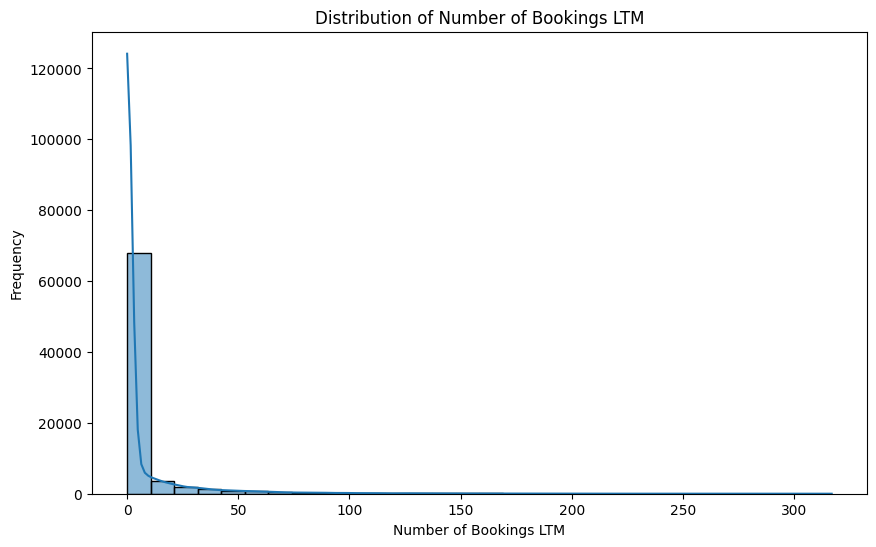

In [14]:
# 연간 예약 횟수 시각화 -> long tail distribution
plot_distribution(df2, 'Number of Bookings LTM') 

<Axes: xlabel='Neighborhood'>

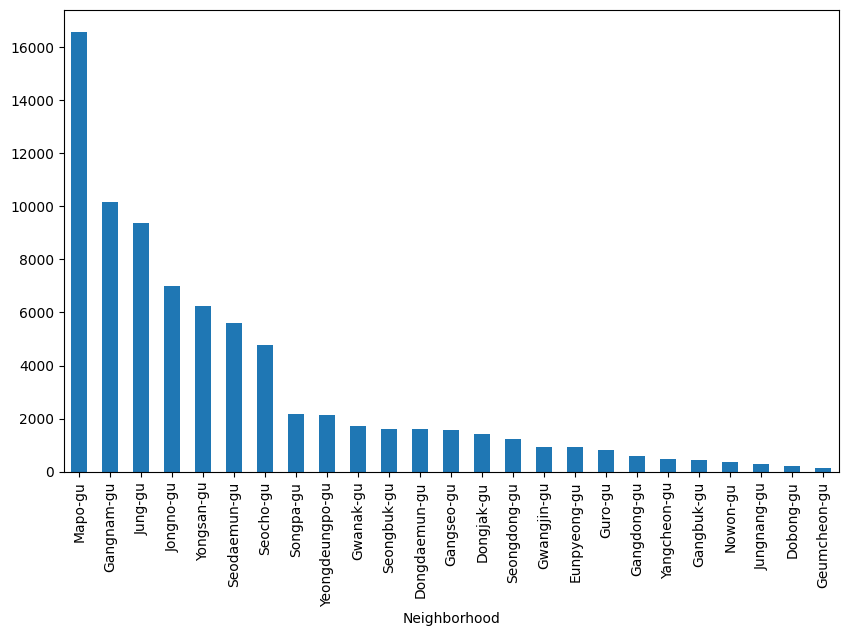

In [15]:
# 숙소 지역 시각화
df2['Neighborhood'].value_counts().plot(kind='bar', figsize=(10, 6))

In [16]:
boundary_gdf = gpd.read_file('../sig.shp', encoding='CP949') # 공간 정보 파일은 거의 다 지원한다.
boundary_gdf.head()

,SIG_CD,SIG_ENG_NM,SIG_KOR_NM,geometry
0,11110,Jongno-gu,종로구,"POLYGON ((956615.453 1953567.199, 956621.579 1..."
1,11140,Jung-gu,중구,"POLYGON ((957890.386 1952616.746, 957909.908 1..."
2,11170,Yongsan-gu,용산구,"POLYGON ((953115.761 1950834.084, 953114.206 1..."
3,11200,Seongdong-gu,성동구,"POLYGON ((959681.109 1952649.605, 959842.412 1..."
4,11215,Gwangjin-gu,광진구,"POLYGON ((964825.058 1952633.250, 964875.565 1..."


In [17]:
from cartoframes.viz import * # 모든 클래스, 함수 불러오기

seoul_gdf = boundary_gdf[boundary_gdf['SIG_CD'].str.startswith('11')]

seoul_gdf.set_crs(epsg=5179, inplace=True) # 미터 단위로 인식
seoul_gdf.to_crs(epsg=4326, inplace=True)  # 통상적인 위/경도로 변경

layer_seoul = Layer(seoul_gdf,
                    basic_style(opacity=0.2), # 투명도
                    popup_hover=popup_element('SIG_KOR_NM', title='Region')) # 얹으면 팝업

layer_seoul

c:\Users\hongju\anaconda3\envs\hjenv\Lib\site-packages\geopandas\geodataframe.py:1525: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [18]:
# geopandas 데이터로 변환
coordinate = gpd.points_from_xy(df2['Longitude'], df2['Latitude'])
gdf2 = gpd.GeoDataFrame(df2, geometry=coordinate)

In [19]:
layer_1 = Layer(gdf2)
layer_1 

In [20]:
temp = gdf2.dropna(subset=['Occupancy Rate LTM'])     # 한 번 이상 손님을 받아본 곳

layer_2 = Layer(temp,
                color_bins_style('Occupancy Rate LTM', palette='sunset'), # 연속형 데이터
                popup_click=popup_element('Listing Title', title='Title')) # 클릭하면 팝업
layer_2

In [21]:
grouped = temp.groupby('Neighborhood')[['Annual Revenue LTM (USD)', 'Occupancy Rate LTM', 'Number of Bookings LTM']]
gu_stats = grouped.mean().reset_index()

gu_stats = pd.merge(gu_stats, seoul_gdf, left_on='Neighborhood', right_on='SIG_ENG_NM', how='left')
gu_stats = gpd.GeoDataFrame(gu_stats)
gu_stats.set_crs(epsg=4326, inplace=True)

gu_stats.rename(columns={'Annual Revenue LTM (USD)': 'Annual_Revenue_LTM'}, inplace=True)

In [22]:
layer_3 = Layer(gu_stats,
                color_bins_style('Occupancy Rate LTM', palette='sunset'), # 연속형 데이터
                popup_hover=popup_element('SIG_ENG_NM', title='SIG_ENG_NM'),
                encode_data=False) # 클릭하면 팝업
layer_3

In [23]:
layer_4 = Layer(gu_stats,
                color_bins_style('Number of Bookings LTM', palette='sunset'), # 연속형 데이터
                popup_hover=popup_element('SIG_ENG_NM', title='SIG_ENG_NM'),
                encode_data=False) # 클릭하면 팝업
layer_4

In [24]:
layer_5 = Layer(gu_stats,
                color_bins_style('Annual_Revenue_LTM', palette='sunset'), # 연속형 데이터
                popup_hover=popup_element('SIG_ENG_NM', title='SIG_ENG_NM'),  # 클릭하면 팝업
                encode_data=False)
layer_5

In [25]:
gu_stats.columns

Index(['Neighborhood', 'Annual_Revenue_LTM', 'Occupancy Rate LTM',
       'Number of Bookings LTM', 'SIG_CD', 'SIG_ENG_NM', 'SIG_KOR_NM',
       'geometry'],
      dtype='object')

In [26]:
# merge two dataframes
df = pd.merge(df1, df2, on='Property ID', how='inner')
df.shape

(2038365, 98)

In [27]:
print(pd.merge(df1, df2, on='Property ID', how='left').shape)
print(pd.merge(df1, df2, on='Property ID', how='right').shape)

(2038365, 98)
(2038993, 98)
